In [23]:
!pip install torch torchvision -U
!pip install ultralytics
!pip install supervision
!pip install cvzone
!pip install cv2

ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2


In [ ]:
#get coordinates for region of interest
#from google.colab.patches import cv2_imshow
def Capture_Event(event, x, y, flags, params):
	#left mouse button is pressed
	if event == cv2.EVENT_LBUTTONDOWN:
		#print x, y coordinates to screen
		print(f"({x}, {y})")

if __name__=="__main__":
	img = cv2.imread('firstframe.jpg', 1)
	cv2_imshow(img)
	cv2.setMouseCallback('image', Capture_Event)
	# Press any key to exit
	cv2.waitKey(0)
	cv2.destroyAllWindows()

In [24]:
# import cv2
# #get first frame of video
# cap = cv2.VideoCapture('wrong_turn')  # Update with your video file path

# # Check if the video file is successfully opened
# if not cap.isOpened():
#     print("Error: Could not open video file.")
#     exit()

# # Read the first frame
# ret, frame = cap.read()

# # Check if the frame is read correctly
# if not ret:
#     print("Error: Could not read frame.")
#     exit()

# output_file = 'firstframe.jpg'

# # Save the first frame as an image file
# cv2.imwrite(output_file, frame)

# print(f"First frame is saved as '{output_file}'.")

# # Release the video capture object and close the file
# cap.release()
# cv2.destroyAllWindows()

In [25]:
from google.colab.patches import cv2_imshow

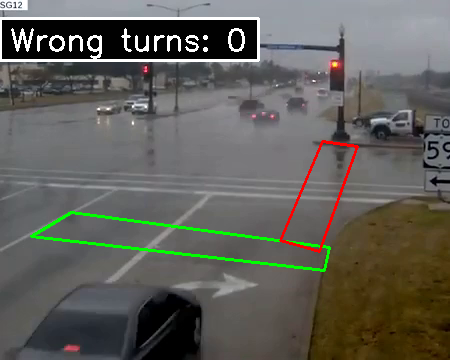

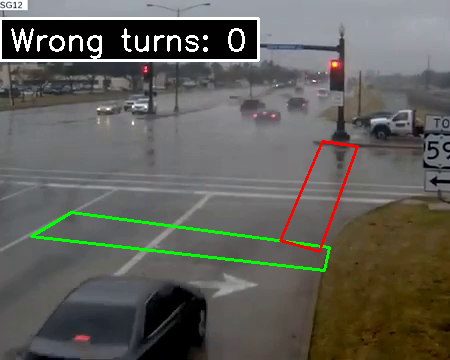

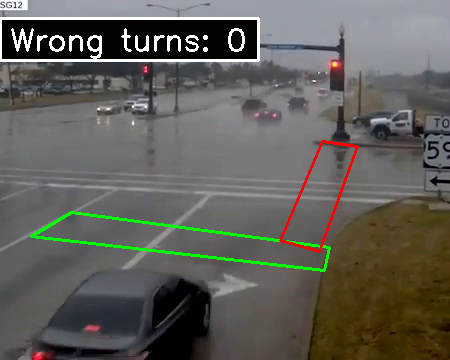

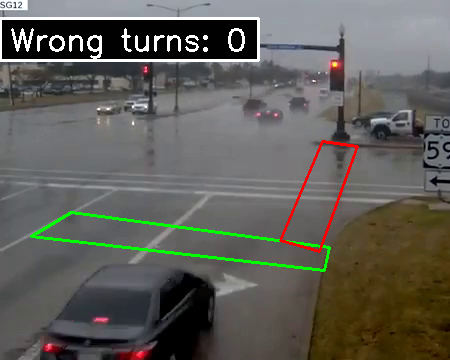

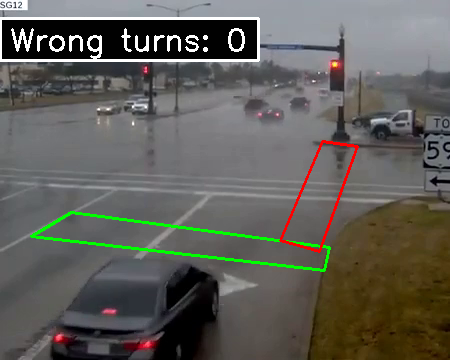

...

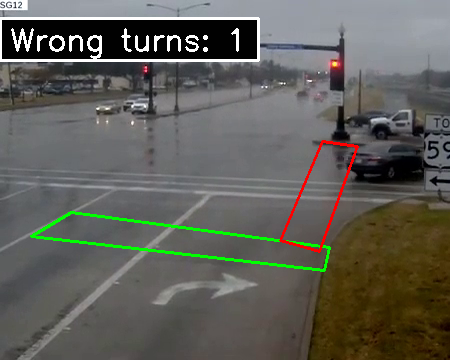

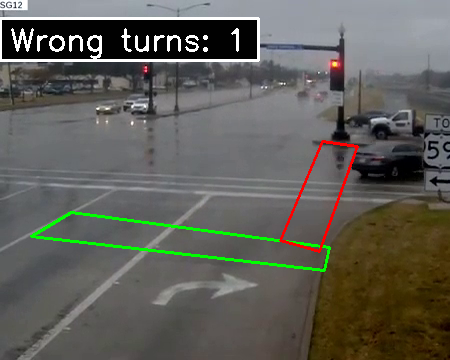

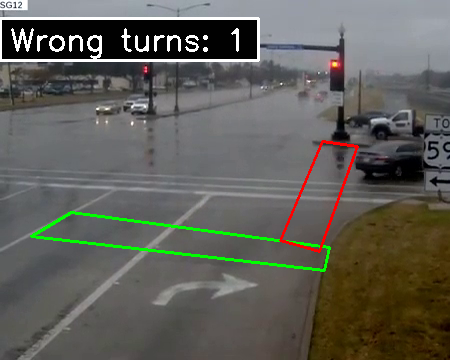

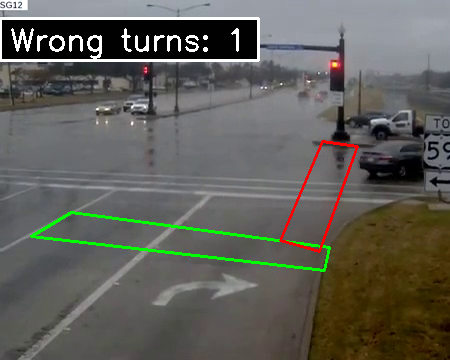

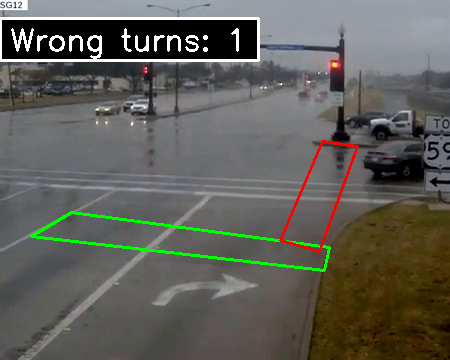

Video saved successfully!


In [29]:
import cv2
from tracker import*
import cvzone
import numpy as np
import os
from datetime import datetime
# Initialize the video capture, saving output to a video
cap = cv2.VideoCapture('wrongway.mp4')
output_video_path = 'wrongturn.mp4'
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
fourcc = cv2.VideoWriter_fourcc(*'XVID')  #define the codec
out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))

#create a background subtractor
fgbg = cv2.createBackgroundSubtractorMOG2()

# area1=[(593,227),(602,279),(785,274),(774,220)]
# area2=[(747,92),(785,208),(823,202),(773,95)]
area1=[(71, 212),(329, 247),(324, 270),(31, 236)]
area2=[(280, 240),(322, 141),(357, 146),(319, 251)]
tracker=Tracker()
#save id and position of vehicles
a1={}
counter=[]

#save image of wrong turn with current date and time
def save_full_frame(frame):
    # Create a folder with the current date and time as the folder name
    current_datetime = datetime.now().strftime("%Y%m%d%H%M%S")
    folder_name = f"wrongturn"
    os.makedirs(folder_name, exist_ok=True)

    # Save the entire frame
    image_filename = os.path.join(folder_name, f"frame_{current_datetime}.jpg")
    cv2.imwrite(image_filename, frame)
while True:
    ret, frame = cap.read()

    if not ret:
        break
    #frame=cv2.resize(frame,(1020,500))
    frame=cv2.resize(frame,(450,360))

    # Apply background subtraction
    #fgbg represents clear bg, subtracting the background
    fgmask = fgbg.apply(frame)

    #threshold the foreground mask
    #250 255 coordinates
    _, thresh = cv2.threshold(fgmask, 250, 250, cv2.THRESH_BINARY)

    # Find contours in the thresholded image
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw rectangles around moving objects
    list=[]
    for contour in contours:
        if cv2.contourArea(contour) >=7:  # Adjust the area threshold as needed
            x, y, w, h = cv2.boundingRect(contour)
            list.append([x,y,w,h])
    bbox_idx=tracker.update(list)
    for bbox in bbox_idx:
        x1,y1,w1,h1,id=bbox
        cx=int(x1+x1+w1)//2
        cy=int(y1+y1+h1)//2
        result=cv2.pointPolygonTest(np.array(area1,np.int32),((cx,cy)),False)
        if result>=0:
           a1[id]=(cx,cy)
        if id in a1:
           result1=cv2.pointPolygonTest(np.array(area2,np.int32),((cx,cy)),False)
           if result1>=0:
              cv2.rectangle(frame, (x1, y1), (x1 + w1, y1 + h1), (0, 255, 0), 2)
              cv2.circle(frame,(cx,cy),7,(0,255,0),-1)
              cvzone.putTextRect(frame,f'{id}',(x1,y1),1,1)
              if counter.count(id)==0:
                 counter.append(id)
                 save_full_frame(frame)
#draw region of interest on frame

    cv2.polylines(frame,[np.array(area1,np.int32)],True,(0,255,0),2)
    cv2.polylines(frame,[np.array(area2,np.int32)],True,(0,0,255),2)

    p=len(counter)
#add text with counter to screen
    cvzone.putTextRect(frame,f'Wrong turns: {p}',(10,50),1,2,
        colorT=(255,255, 255), colorR=(1, 1, 1),
        font=cv2.FONT_HERSHEY_SIMPLEX,
        offset=10,
        border=2, colorB=(255, 255, 255) )
    out.write(frame)
    cv2_imshow(frame)

    if cv2.waitKey(1) & 0xFF == 27:  # Press 'Esc' to exit
        break

# Release the video capture and close all OpenCV windows
cap.release()
cv2.destroyAllWindows()
out.release()

print("Video saved successfully!")

In [ ]:
#first vid
# area1=[(71, 212),(329, 247),(324, 270),(31, 236)]
# area2=[(280, 240),(322, 141),(357, 146),(319, 251)]
# if cv2.contourArea(contour) >= 7: